# Medical No-Show Analysis and Prediction

__By:__ _Takesh Sahu_

### Table of Contents:

#### Objective

#### Data Description

#### Data Preprocessing
1. Data Preparation
2. Feature Engineering

#### Exploratory Data Analysis
1. Data Analysis using various plots
2. Feature Distribution 
3. Feature Importance Plot
4. Feature Selection

#### Model Design and Analysis
1. Handling of Class Imbalance
2. Models implemented
    - Random Forest
    - Naive Bayes
    - Logistic Regression
    - Artificial Neural Network
3. Model prediction

#### Closing Remarks

##### Instructions:
- Please set the path to dataset file before running the code
- Need to install specific packages such as imblearn package
- Be patient, it will take around an half hour to run the complete code

## Objective of this project

    • To leverage the basic libraries such as pandas, numpy in Python
    • To perform some exploratory data analysis using visualization libraries such as matplotlib, seaborn, plotly
    • To understand how to write functions and how to handle data structures
    • To utilize the machine learning library "sci-kit learn" to formulate models 

## Data Description

Data set consists of 300k medical appointments and its 15 variables (characteristics) of each.

#### Data Dictionary
    • PatientId : Patient unique Id
    • AppointmentID : Appointment ID of a patient
    • Gender : Male or Female
    • ScheduledDay : The day it was scheduled
    • AppointmentDay : The day of an appointment
    • Age : How old is the patient
    • Neighbourhood : Where the appointment takes place
    • Scholarship : True or False 
    • Hipertension : True or False 
    • Diabetes : True or False 
    • Alcoholism : True or False 
    • Handcap : True or False 
    • SMS_received : 1 or more messages sent to the patient
    • No-show : No or Yes
    
Final Task : What if it is possible to predict someone to no-show an appointment?

## Data Preprocessing

This is the most fundamental step where I performed some required data wrangling and explored the data to check for missing values/erroneous entries as well as also commented on redundant features and added additional ones, wherever required.

### Loading the necessary packages

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.cross_validation import KFold

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV

from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import zero_one_loss
from sklearn.metrics import confusion_matrix

from IPython.display import Image

import itertools

C:\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [3]:
KFold

sklearn.cross_validation.KFold

In [4]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
print(__version__)

2.5.1


In [5]:
import cufflinks as cf
# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()

sns.set_style("whitegrid")
%matplotlib inline

In [6]:
# Let's load the data set and have a first look at it
df = pd.read_csv('NoShow.csv')
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,29872499824296,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,558997776694438,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4262962299951,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,867951213174,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8841186448183,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


In [7]:
#Let's get some info about the data set, and check the NA/missing values in the data set
df.info()
sum(df.isnull().sum())
# We can notice that the data set has 14 columns and 110527 rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110527 entries, 0 to 110526
Data columns (total 14 columns):
PatientId         110527 non-null int64
AppointmentID     110527 non-null int64
Gender            110527 non-null object
ScheduledDay      110527 non-null object
AppointmentDay    110527 non-null object
Age               110527 non-null int64
Neighbourhood     110527 non-null object
Scholarship       110527 non-null int64
Hipertension      110527 non-null int64
Diabetes          110527 non-null int64
Alcoholism        110527 non-null int64
Handcap           110527 non-null int64
SMS_received      110527 non-null int64
No-show           110527 non-null object
dtypes: int64(9), object(5)
memory usage: 11.8+ MB


0

#### We can notice that the data set has no null values.

In [8]:
#Let's also check for any outliers
df.describe()

,PatientId,AppointmentID,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received
count,1.105270e+05,1.105270e+05,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000
mean,1.474963e+14,5.675305e+06,37.088874,0.098266,0.197246,0.071865,0.030400,0.022248,0.321026
std,2.560949e+14,7.129575e+04,23.110205,0.297675,0.397921,0.258265,0.171686,0.161543,0.466873
min,3.921800e+04,5.030230e+06,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.172614e+12,5.640286e+06,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.173184e+13,5.680573e+06,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,9.439172e+13,5.725524e+06,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,9.999816e+14,5.790484e+06,115.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000


Let's delete the ages that seems improbable as minimum age cannot be -1 and maximum age of 115 is not often heard(outlier).
Hence we will restrict ages from 0 to 100 and 0 can be possible because a baby can be less than a year old (in months). 

In [9]:
df=df[(df['Age']>=0) & (df['Age']<100)]

### Correcting the variable names

In [10]:
#Some of the column names have typos, so renaming those.
df.rename(columns = {'Hipertension': 'Hypertension', 'No-show': 'NoShowStatus', 'Handcap': 'Handicap'}, inplace = True)
print(df.columns)

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDay',
       'AppointmentDay', 'Age', 'Neighbourhood', 'Scholarship', 'Hypertension',
       'Diabetes', 'Alcoholism', 'Handicap', 'SMS_received', 'NoShowStatus'],
      dtype='object')


### Fixing the date in Scheduled day and Appointment day into datatime format

In [11]:
# Let's fix the data first, Scheduled day and Appointment day can be splitted into Hour of the day of the appointment and day of the week for appointment 
df['ScheduledDay'] = df['ScheduledDay'].apply(np.datetime64)
df['AppointmentDay'] = df['AppointmentDay'].apply(np.datetime64)

### Feature Engineering
#### Creating new features to show the number of days from registration to appointment and day of the week for an appointment as well as let's also calculate the hour and date for the appointment scheduled and day

In [12]:
# Function to calculate hour from timestamp
def calculate_hour(timestamp):
    timestamp = str(timestamp)
    hour = int(timestamp[11:13])
    minute = int(timestamp[14:16])
    second = int(timestamp[17:])
    return round(hour + minute/60 + second/3600)

# Function to separate date from timestamp
def separate_date(day):
    day=str(day)
    day=str(day[:10])
    return day

df['HourOfTheDay'] = df.ScheduledDay.apply(calculate_hour)
df['ScheduledDate'] = df.ScheduledDay.apply(separate_date)
df['AppointmentDay'] = df.AppointmentDay.apply(separate_date)

# Calculating the day of the week and difference of days between scheduled day and appointment day
df['ScheduledDate'] = df['ScheduledDate'].apply(np.datetime64)
df['ScheduledDate'] = pd.to_datetime(df['ScheduledDate'])

df['AppointmentDay'] = df['AppointmentDay'].apply(np.datetime64)
df['AppointmentDay'] = pd.to_datetime(df['AppointmentDay'])
df['MonthNumber'] = df['AppointmentDay'].dt.month

df['#DaysFromSchToAppt'] = df['AppointmentDay'] - df['ScheduledDate']
df['DayOfTheWeek'] = df['AppointmentDay'].dt.weekday_name
df.tail()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,NoShowStatus,HourOfTheDay,ScheduledDate,MonthNumber,#DaysFromSchToAppt,DayOfTheWeek
110522,2572134369293,5651768,F,2016-05-03 09:15:35,2016-06-07,56,MARIA ORTIZ,0,0,0,0,0,1,No,9,2016-05-03,6,35 days,Tuesday
110523,3596266328735,5650093,F,2016-05-03 07:27:33,2016-06-07,51,MARIA ORTIZ,0,0,0,0,0,1,No,7,2016-05-03,6,35 days,Tuesday
110524,15576631729893,5630692,F,2016-04-27 16:03:52,2016-06-07,21,MARIA ORTIZ,0,0,0,0,0,1,No,16,2016-04-27,6,41 days,Tuesday
110525,92134931435557,5630323,F,2016-04-27 15:09:23,2016-06-07,38,MARIA ORTIZ,0,0,0,0,0,1,No,15,2016-04-27,6,41 days,Tuesday
110526,377511518121127,5629448,F,2016-04-27 13:30:56,2016-06-07,54,MARIA ORTIZ,0,0,0,0,0,1,No,14,2016-04-27,6,41 days,Tuesday


#### It is interesting to note that the time portions have vanished from the AppointmentDay timedeltas, because all appointment times were set exactly to 00:00:00

## Exploratory Data Analysis

In [13]:
# We need to transform the data a bit, so let's just begin with it
pv = df.pivot_table(values=["Diabetes","Alcoholism","Hypertension","Handicap"],columns="NoShowStatus",index="MonthNumber",aggfunc=np.sum)
df_pv = pv.unstack().unstack('NoShowStatus').reset_index().rename(columns={"level_0":"Category"})
df_pv["NoShowRate"] = df_pv['Yes'] / (df_pv['Yes'] + df_pv['No'])  #Yes --> No-Show, No --> Show-Up
df_pv.head()

NoShowStatus,Category,MonthNumber,No,Yes,NoShowRate
0,Alcoholism,4,87,16,0.155340
1,Alcoholism,5,1916,497,0.205968
2,Alcoholism,6,680,164,0.194313
3,Diabetes,4,200,41,0.170124
4,Diabetes,5,4669,1073,0.186869


Note:    Yes --> No-Show    and    No --> Show-Up

In [14]:
# Let's create a line graph showing the trends. We can alter this to make it a function later but for now,
# we are just going to filter and plot
Diabetes = df_pv[df_pv['Category'] == 'Diabetes']
Alcoholism = df_pv[df_pv['Category'] == 'Alcoholism']
Handicap = df_pv[df_pv['Category'] == 'Handicap']
Hypertension = df_pv[df_pv['Category'] == 'Hypertension']

line1 = go.Scatter(
    x= Diabetes['MonthNumber'],
    y=Diabetes['NoShowRate']*100,
    mode= 'lines+markers',
    text=Diabetes['Category'],
    name="Diabetes")

line2 = go.Scatter(
    x= Alcoholism['MonthNumber'],
    y=Alcoholism['NoShowRate']*100,
    mode= 'lines+markers',
    text=Alcoholism['Category'],
    name="Alcoholism")

line3 = go.Scatter(
    x= Handicap['MonthNumber'],
    y=Handicap['NoShowRate']*100,
    mode= 'lines+markers',
    text=Handicap['Category'],
    name='Handicap')

line4 = go.Scatter(
    x= Hypertension['MonthNumber'],
    y=Hypertension['NoShowRate']*100,
    mode= 'lines+markers',
    text=Hypertension['Category'],
    name='Hypertension')


layout = dict(title = "No Shows",hovermode='closest',xaxis=dict({"title":"Months"}),
             yaxis=dict({"title":"No Show Rate (Percentage)"}))
dat = [line1,line2,line3,line4]
fig = go.Figure(data=dat,layout=layout)
iplot(fig,filename='basic-line')

We can see that, Alcoholism has the highest overall no-show rate for the given months.

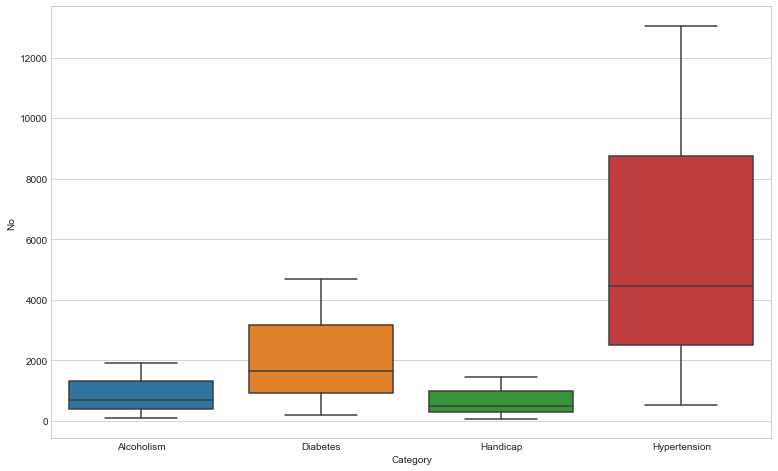

In [15]:
figure = plt.figure(figsize=(10,6))
ax = figure.add_axes([0,0,1,1])
sns.boxplot(x="Category",y="No",data=df_pv)  # No --> Show-Up

#sns.violinplot(x="Category", y="No", data=df_pv,palette='rainbow')
#sns.swarmplot(x="Category", y="No", data=df_pv,color='black',size=3)

In [16]:
# Let's also explore the Patient Id
len(df.PatientId) == len(df.PatientId.unique())

False

From the above, We can notice that Patient Id is not unique, implies that some patients schedule multiple appointments.

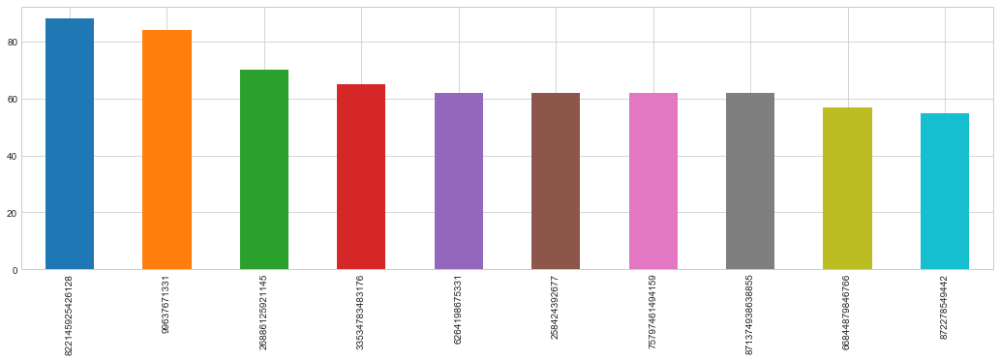

In [17]:
df['PatientId'].value_counts().head(10).plot(kind='bar',figsize=(18,5))

Mean number of appointments per patient:	1.6342328747331074
Median number of appointments per patient:	1.0


<function matplotlib.pyplot.show>

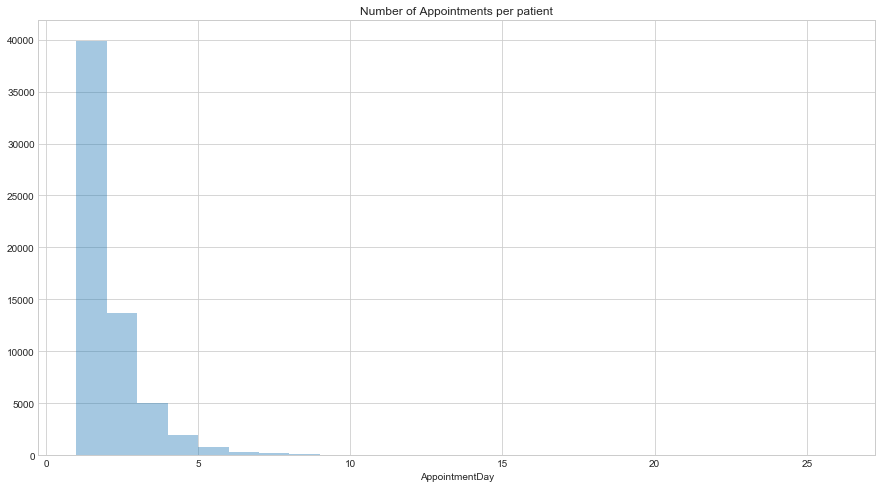

In [18]:
# Histogram of number of appointments per patient
x = df.groupby('PatientId')['AppointmentDay'].nunique()

print('Mean number of appointments per patient:\t%s' %np.mean(x))
print('Median number of appointments per patient:\t%s' %np.median(x))
plt.figure(figsize=(15,8))
sns.distplot(x, bins = x.nunique(), kde=False)
plt.title("Number of Appointments per patient")
plt.show

In [19]:
# We can notice that the Appointment ID is unique and that makes sense because for each appointment, unique Id is generated.
len(df.AppointmentID) == len(df.AppointmentID.unique())

True

In [20]:
# Let's have a look at the distribution of the days between the appointment scheduled and appointment date. 
print(df['#DaysFromSchToAppt'].value_counts().head(5))
df['#DaysFromSchToAppt'].iplot(kind='hist',bins=50)

0 days    38560
2 days     6724
4 days     5290
1 days     5211
7 days     4906
Name: #DaysFromSchToAppt, dtype: int64


In [21]:
# count of show-up and no-show
print (df['NoShowStatus'].value_counts())
layout_1 = cf.Layout(height=500, 
                     width=500, 
                     title= 'Count of Show-up and No-show')

no_show_plot = df['NoShowStatus'].value_counts().iplot(kind='bar', 
                                                       xTitle = 'No Show Status', 
                                                       yTitle= 'Count', 
                                                       theme = 'polar', 
                                                       layout = layout_1,
                                                       legend=True, 
                                                       color = 'red')

No     88199
Yes    22316
Name: NoShowStatus, dtype: int64


In [22]:
## Let's see how many of Men's and Women's did not showed up for an appointment
No_Show_Gender=df.groupby(['Gender','NoShowStatus'])['NoShowStatus'].size()
print(No_Show_Gender)
layout_2 = cf.Layout(height=600,
                     width=500, 
                     barmode='stack',
                     title= 'Count of Show-up and No-show based on Gender')

No_Show_Gender_plot=df.groupby(['Gender','NoShowStatus'])['NoShowStatus'].size().unstack().iplot(kind='bar', 
                                                                                                 xTitle = 'Gender', 
                                                                                                 yTitle= 'Count',
                                                                                                 layout = layout_2)

Gender  NoShowStatus
F       No              57239
        Yes             14591
M       No              30960
        Yes              7725
Name: NoShowStatus, dtype: int64


In [23]:
#Let's visualize different problems count for both the genders
reason = df[['Gender','Hypertension', 'Diabetes', 'Alcoholism', 'Handicap']].groupby(['Gender']).sum()
print(reason)
reason_plot = df[['Gender','Hypertension', 'Diabetes', 'Alcoholism', 'Handicap']].groupby(['Gender']).sum().iplot(kind='bar')

        Hypertension  Diabetes  Alcoholism  Handicap
Gender                                              
F              15338      5606        1223      1400
M               6462      2337        2137      1053


#### From the above chart, it can be observed that  both the genders suffers max from Hypertension but female are more prone to it, and in terms of alcoholisim males consume more than the womens.

Text(0.5,1,'Visit to the doctor based on Gender')

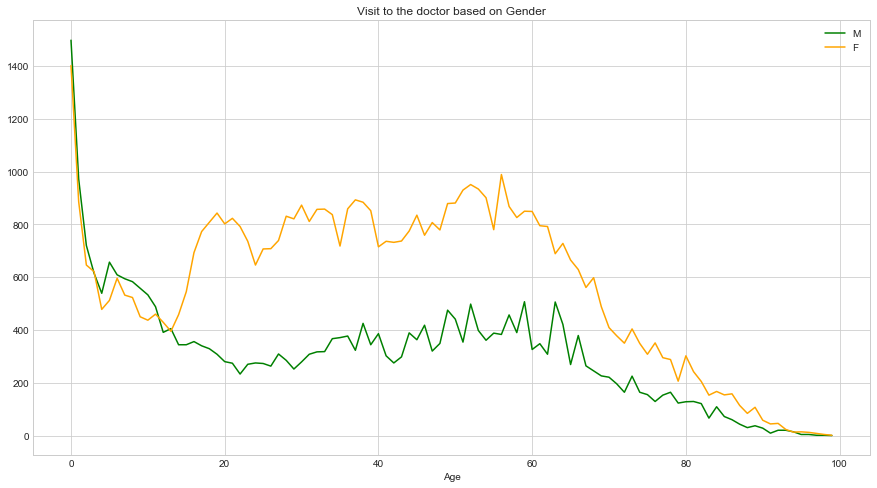

In [24]:
df1 = df.copy()
df1 = df1[df1.NoShowStatus == 'No'].copy()
range_df1 = pd.DataFrame()
range_df1['Age'] = range(100)
men = range_df1['Age'].apply(lambda x: len(df1[(df1['Age'] == x) & (df1['Gender'] == 'M')]))
women = range_df1['Age'].apply(lambda x: len(df1[(df1['Age'] == x) & (df1['Gender'] == 'F')]))
plt.figure(figsize=(15,8))
plt.plot(range(100),men, 'green')
plt.plot(range(100),women, color = 'orange')
plt.legend(['M','F'])
plt.xlabel('Age')
plt.title('Visit to the doctor based on Gender')

#### Women are twice as likely to visit the doctor however this effect is true only from a range of age.
#### Till age 14, their frequency is similar but after that age it can be seen that woman visits the doctor almost 2.5 times more than every man

Monday 22712
Tuesday 25637
Wednesday 25866
Thursday 17244
Friday 19017
Saturday 39


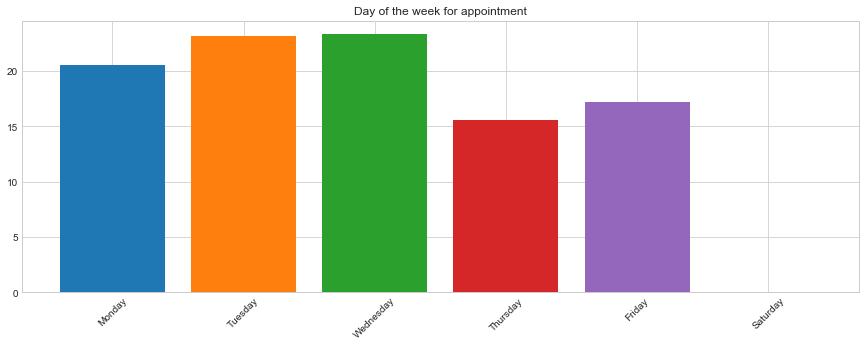

In [25]:
#Lets observe if there is any particular day people book their appointment
#Now we can depict from the graph that appointments are higher on Monday/Tuesday?wednesday and least on Saturday(Enjoying the weekend)
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
plt.figure(figsize=(15,5))
for index,i in enumerate(weekdays):
    j=df[df['DayOfTheWeek']==i]
    count=len(j)
    total_count=len(df)
    perc=(count/total_count)*100
    print(i,count)
    plt.bar(index,perc)
plt.xticks(range(len(weekdays)),weekdays, rotation=45)
plt.title('Day of the week for appointment')
plt.show()

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

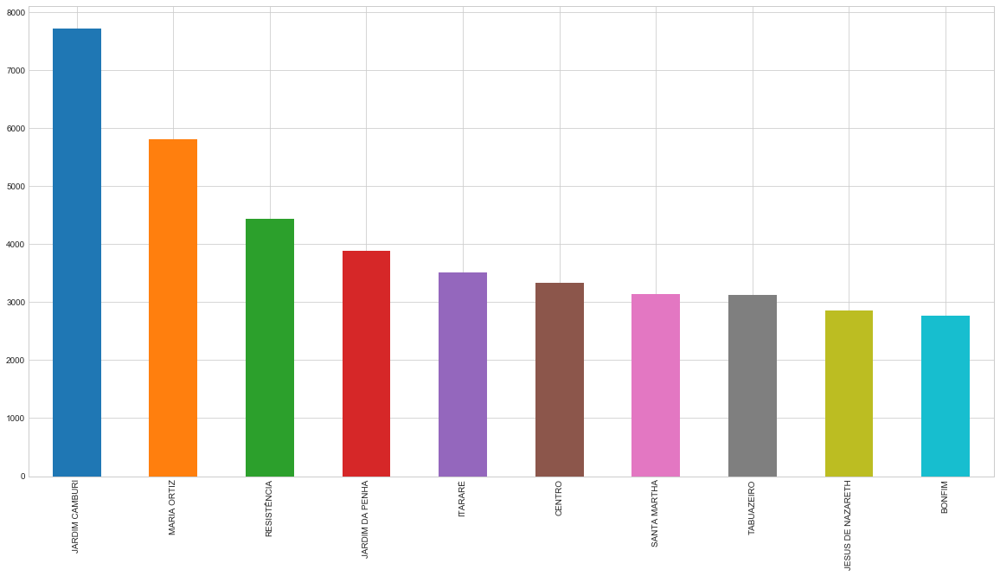

In [26]:
# Lets analyse the location of hospitals 
location = df.groupby(['Neighbourhood'],sort=True).size()
#print(location.sort_values())
df['Neighbourhood'].value_counts().head(10).plot(kind='bar',figsize=(20,10))
plt.xticks(rotation=90)

The above are the top ten hospitals where most of the patients visit.

### Feature Selection

In [27]:
no_show = df.copy()

# Dropping the non-predictors
no_show.drop(['PatientId','AppointmentID', 'AppointmentDay','ScheduledDay', 'ScheduledDate', '#DaysFromSchToAppt', 
              'SMS_received','Neighbourhood','MonthNumber'], inplace=True, axis=1)

In [28]:
no_show.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110515 entries, 0 to 110526
Data columns (total 10 columns):
Gender          110515 non-null object
Age             110515 non-null int64
Scholarship     110515 non-null int64
Hypertension    110515 non-null int64
Diabetes        110515 non-null int64
Alcoholism      110515 non-null int64
Handicap        110515 non-null int64
NoShowStatus    110515 non-null object
HourOfTheDay    110515 non-null int64
DayOfTheWeek    110515 non-null object
dtypes: int64(7), object(3)
memory usage: 9.3+ MB


In [29]:
no_show['Gender'] = no_show['Gender'].apply(lambda x: 1 if x == 'M' else 0)
no_show['NoShowStatus'] = no_show['NoShowStatus'].apply(lambda x: 1 if x == 'Yes' else 0)
no_show.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110515 entries, 0 to 110526
Data columns (total 10 columns):
Gender          110515 non-null int64
Age             110515 non-null int64
Scholarship     110515 non-null int64
Hypertension    110515 non-null int64
Diabetes        110515 non-null int64
Alcoholism      110515 non-null int64
Handicap        110515 non-null int64
NoShowStatus    110515 non-null int64
HourOfTheDay    110515 non-null int64
DayOfTheWeek    110515 non-null object
dtypes: int64(9), object(1)
memory usage: 9.3+ MB


In [30]:
# To plot feature importance as well as to plot the distribution of each attributes, label Encoding is performed for categorical attributes
df_plt = no_show.copy()
df_plt = df_plt.select_dtypes(exclude=['number']) \
                .apply(LabelEncoder().fit_transform)\
                .join(df_plt.select_dtypes(include=['number']))
df_plt.head()

,DayOfTheWeek,Gender,Age,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,NoShowStatus,HourOfTheDay
0,0,0,62,0,1,0,0,0,0,19
1,0,1,56,0,0,0,0,0,0,16
2,0,0,62,0,0,0,0,0,0,16
3,0,0,8,0,0,0,0,0,0,17
4,0,0,56,0,1,1,0,0,0,16


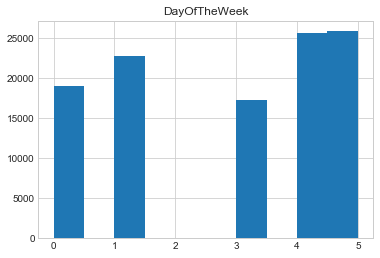

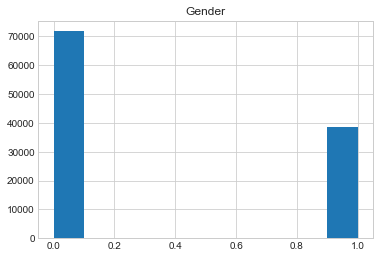

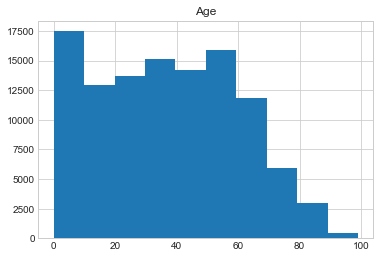

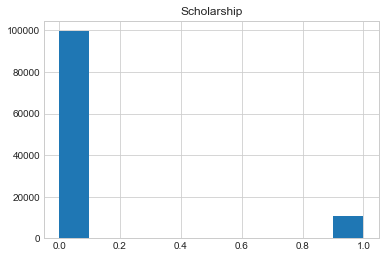

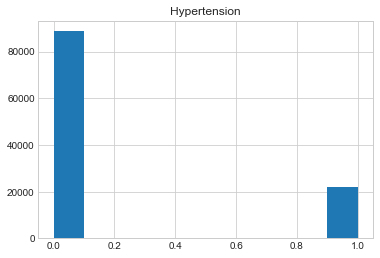

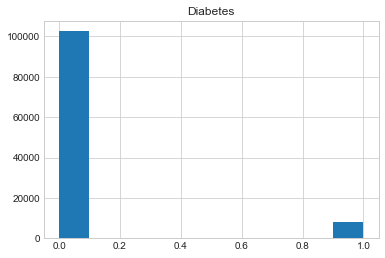

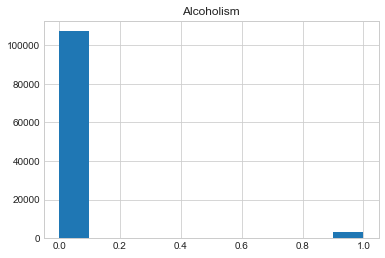

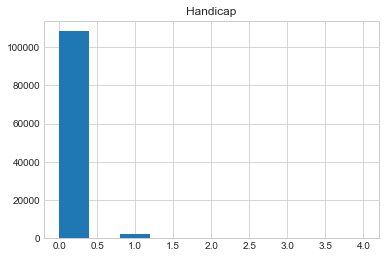

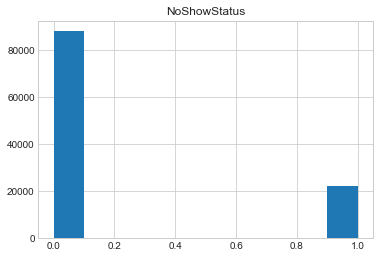

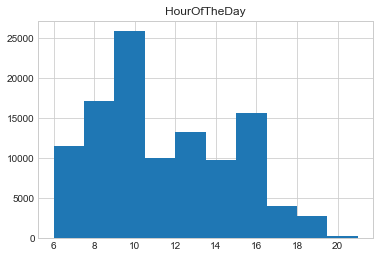

In [31]:
# Histogram of the predictive features
cols= df_plt.columns
for i in cols:
 df_plt.hist(i)
 plt.show()

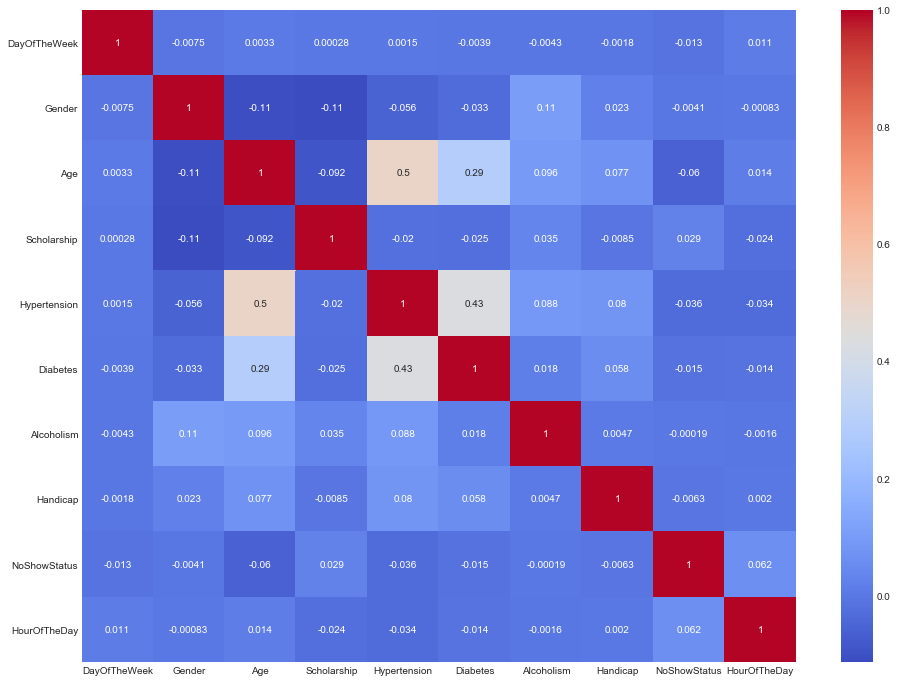

In [32]:
# Correlation Matrix Plot
plt.figure(figsize=(16,12))
sns.heatmap(df_plt.corr(),cmap='coolwarm', annot=True)

We can conclude from this correlation plot that as the age increases, hypertension of a person increases and also the hypertension and diabetes are positively correlated.

### Feature Importance Plot Using Random Forest

In [33]:
y_pt = df_plt.pop('NoShowStatus')
X_pt = pd.DataFrame(df_plt)

In [34]:
y_pt.nunique()

2

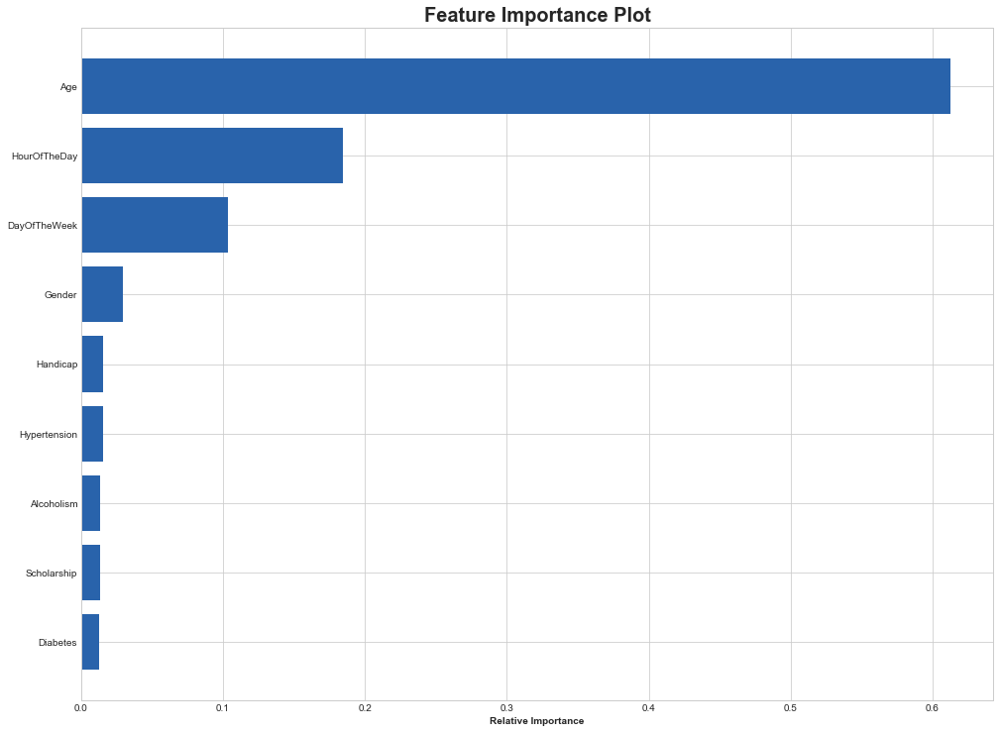

In [35]:
clf_random = RandomForestClassifier(random_state=122, criterion = 'entropy')
clf_random.fit(X_pt,y_pt)
features = X_pt.columns
importances = clf_random.feature_importances_
indices = np.argsort(importances)
plt.title('Feature Importance Plot',fontsize=20,fontweight="bold")
plt.barh(range(len(indices)), importances[indices], color='#2963ab', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance',fontweight="bold")
fig = plt.gcf()
fig.set_size_inches(16.5, 12.5, forward=True)
plt.show()

From this above plot, Age is the most important feature (which is reasonable) in predicting the labels followed by HourOfTheDay and DayOfTheWeek.

In [36]:
# Generating dummies for "DayOfTheWeek"
dow = pd.get_dummies(no_show['DayOfTheWeek'], prefix="DOW")
no_show = no_show.select_dtypes(exclude=['object']) \
                .join(dow)
no_show.head()

,Gender,Age,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,NoShowStatus,HourOfTheDay,DOW_Friday,DOW_Monday,DOW_Saturday,DOW_Thursday,DOW_Tuesday,DOW_Wednesday
0,0,62,0,1,0,0,0,0,19,1,0,0,0,0,0
1,1,56,0,0,0,0,0,0,16,1,0,0,0,0,0
2,0,62,0,0,0,0,0,0,16,1,0,0,0,0,0
3,0,8,0,0,0,0,0,0,17,1,0,0,0,0,0
4,0,56,0,1,1,0,0,0,16,1,0,0,0,0,0


In [37]:
y = no_show.pop('NoShowStatus')
X = pd.DataFrame(no_show)

In [38]:
X.head()

,Gender,Age,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,HourOfTheDay,DOW_Friday,DOW_Monday,DOW_Saturday,DOW_Thursday,DOW_Tuesday,DOW_Wednesday
0,0,62,0,1,0,0,0,19,1,0,0,0,0,0
1,1,56,0,0,0,0,0,16,1,0,0,0,0,0
2,0,62,0,0,0,0,0,16,1,0,0,0,0,0
3,0,8,0,0,0,0,0,17,1,0,0,0,0,0
4,0,56,0,1,1,0,0,16,1,0,0,0,0,0


In [39]:
y.value_counts(True)

0    0.798073
1    0.201927
Name: NoShowStatus, dtype: float64

#### We can clearly see that there exists a class imbalance.

### Handling the class imbalance using SMOTETomek

In [40]:
#The following function performs over-sampling using SMOTE and cleaning using Tomek links to generate less noise data to eradicate class imbalance
from imblearn.combine import SMOTETomek
smt = SMOTETomek(random_state=111)
X_res, y_res = smt.fit_sample(X, y)
from collections import Counter
print('Resampled dataset size {}'.format(sorted(Counter(y_res).items())))

Resampled dataset size [(0, 88186), (1, 88186)]


In [41]:
X_res.shape

(176372, 14)

In [42]:
y_res = np.reshape(y_res,(len(y_res),1))
y_res.shape

(176372, 1)

#### Scaling the variables using MinMaxScaler
Various attributes have different range of values they take.Hence, it is important that we bring all the attributes on the same scale. For this purpose we use MinMax Scaler from sklearn library.

__MinMaxScaler__ 
This estimator scales and translates each feature individually such that it is in the given range on the training set, i.e. between zero and one. This transformation is often used as an alternative to zero mean, unit variance scaling.

The transformation is given by:
```
X_std = (X - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0))

X_scaled = X_std * (max - min) + min
```
where min, max = feature_range.

In [43]:
scaler = MinMaxScaler()
scaled_X_res = scaler.fit_transform(X_res)
#Train and valid splits
X_train,X_test,y_train,y_test = train_test_split(scaled_X_res,y_res,test_size=0.25, random_state = 5555)

### Function to plot confusion matrix

In [44]:
sns.set_style('white')

## Confusion Matrix
class_names = ['Show-Up', 'No-Show']
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.summer_r):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

## Model Design and Analysis

### Random Forest

In [45]:
clf_ran = RandomForestClassifier(random_state=122)
clf_ran.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=122, verbose=0, warm_start=False)

_____________________________________________________________
Accuracy score on train data: 0.829580
Accuracy score on test data: 0.750369
Classification Report:
             precision    recall  f1-score   support

          0       0.74      0.78      0.76     22110
          1       0.77      0.72      0.74     21983

avg / total       0.75      0.75      0.75     44093

_____________________________________________________________
Confusion matrix, without normalization
[[17249  4861]
 [ 6146 15837]]
Normalized confusion matrix
[[0.78 0.22]
 [0.28 0.72]]


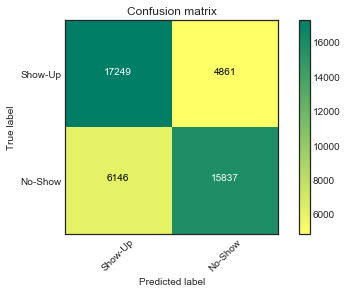

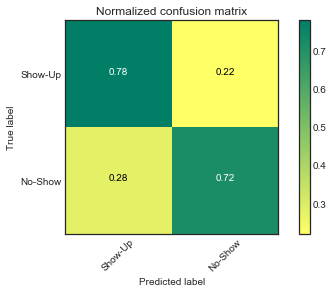

In [46]:
y_pred_ran_train = clf_ran.predict(X_train)
y_pred_ran_test = clf_ran.predict(X_test)

acc_ran_train = metrics.accuracy_score(y_train, y_pred_ran_train)
acc_ran_test = metrics.accuracy_score(y_test, y_pred_ran_test)
rp_ran = metrics.classification_report(y_test, y_pred_ran_test)
print("_____________________________________________________________")
print("Accuracy score on train data: {:5f}".format(acc_ran_train))
print("Accuracy score on test data: {:5f}".format(acc_ran_test))
print("Classification Report:")
print(rp_ran)
print("_____________________________________________________________")

# Compute confusion matrix
cnf_mat_rf = confusion_matrix(y_test, y_pred_ran_test)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_mat_rf, classes=class_names,
                      title='Confusion matrix')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_mat_rf, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()

### Naive Bayes

_____________________________________________________________
Accuracy score on train data: 0.530984
Accuracy score on test data: 0.534280
Classification Report:
             precision    recall  f1-score   support

          0       0.56      0.36      0.43     22110
          1       0.52      0.71      0.60     21983

avg / total       0.54      0.53      0.52     44093

_____________________________________________________________
Confusion matrix, without normalization
[[ 7902 14208]
 [ 6327 15656]]
Normalized confusion matrix
[[0.36 0.64]
 [0.29 0.71]]


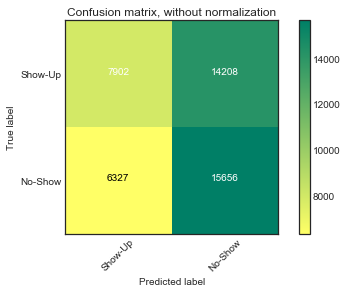

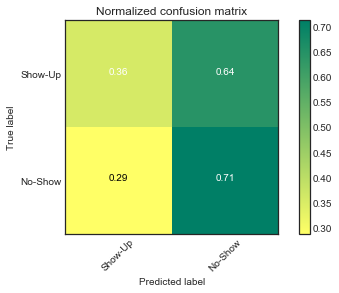

In [47]:
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB

clf_nb =  MultinomialNB().fit(X_train, y_train)

y_pred_nb_train = clf_nb.predict(X_train)
y_pred_nb_test = clf_nb.predict(X_test)

acc_nb_train = metrics.accuracy_score(y_train, y_pred_nb_train)
acc_nb_test = metrics.accuracy_score(y_test, y_pred_nb_test)
rp_nb = metrics.classification_report(y_test, y_pred_nb_test)
print("_____________________________________________________________")
print("Accuracy score on train data: {:5f}".format(acc_nb_train))
print("Accuracy score on test data: {:5f}".format(acc_nb_test))
print("Classification Report:")
print(rp_nb)
print("_____________________________________________________________")

# Compute confusion matrix
cnf_matrix_nb = confusion_matrix(y_test, y_pred_nb_test)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix_nb, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix_nb, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

### Logistic Regression (With Cross Validation)

In [48]:
fold = KFold(len(y_train), n_folds=10, shuffle=True, random_state=777)
logit = LogisticRegressionCV(Cs=list(np.power(10.0, np.arange(-10, 10)))
        ,penalty='l2'
        ,scoring='roc_auc'
        ,cv=fold
        ,random_state=777
        ,max_iter=10000
        ,fit_intercept=True
        ,solver='newton-cg')
log_model = logit.fit(X_train,y_train)

In [49]:
print("__________________________________________")
print("Max auc_roc score: {}".format(log_model.scores_[1].max()))
print("Best mean auc_roc score: {:.4f}".format(log_model.scores_[1].mean(axis=0).max()))
print("__________________________________________")

__________________________________________
Max auc_roc score: 0.5747926402310495
Best mean auc_roc score: 0.5649
__________________________________________


_____________________________________________________________
Accuracy score on train data: 0.545189
Accuracy score on test data: 0.550632
Classification Report:
             precision    recall  f1-score   support

          0       0.55      0.53      0.54     22110
          1       0.55      0.57      0.56     21983

avg / total       0.55      0.55      0.55     44093

_____________________________________________________________
Confusion matrix, without normalization
[[11673 10437]
 [ 9377 12606]]
Normalized confusion matrix
[[0.53 0.47]
 [0.43 0.57]]


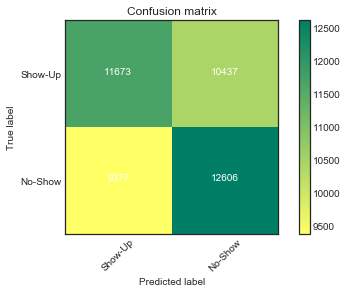

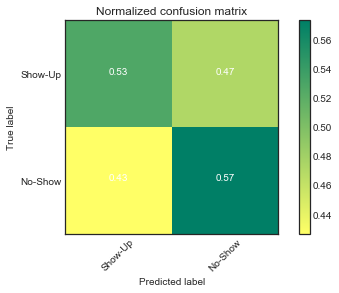

In [50]:
y_pred_train = log_model.predict(X_train)
y_pred_test = log_model.predict(X_test)

acc_train = metrics.accuracy_score(y_train, y_pred_train)
acc_test = metrics.accuracy_score(y_test, y_pred_test)
rp = metrics.classification_report(y_test, y_pred_test)
print("_____________________________________________________________")
print("Accuracy score on train data: {:5f}".format(acc_train))
print("Accuracy score on test data: {:5f}".format(acc_test))
print("Classification Report:")
print(rp)
print("_____________________________________________________________")

# Compute confusion matrix
cnf_matrix_lg = confusion_matrix(y_test, y_pred_test)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix_lg, classes=class_names,
                      title='Confusion matrix')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix_lg, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()

### Artificial Neural Network

Text(0,0.5,'Error rate')

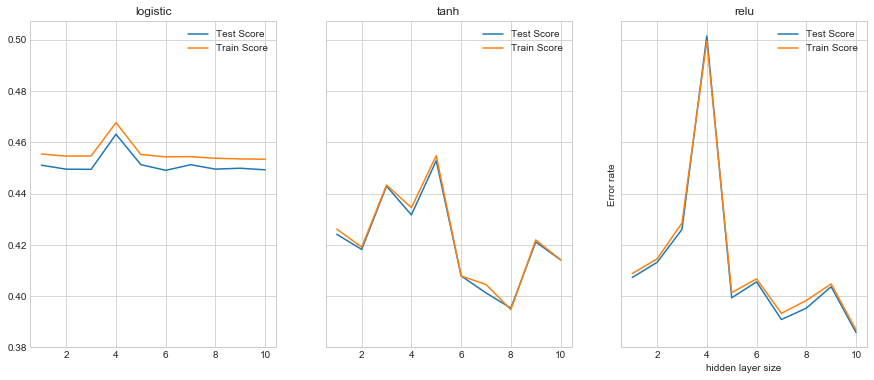

In [51]:
from sklearn.neural_network import MLPClassifier
sns.set_style('whitegrid')
fig, axs = plt.subplots(1,3, figsize=(15, 6), facecolor='w', edgecolor='k', sharex=True, sharey=True)

axs = axs.ravel()

hidden_layer_sizes = [(5), (5,5), (5,5,5), (5,2,5,2), (10), (10,5), (10,5,5), (10,5,5,3), (5,4,3), (5,3,4)]
activation = ['logistic', 'tanh', 'relu']
    
for k in range(0, len(activation)):
    
    error_test=[]
    error_train=[]
    for i in range(0, len(hidden_layer_sizes)):
        mlp = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes[i], max_iter=20, activation = activation[k], tol=1e-4, random_state=23432)
    
        mlp.fit(X_train, y_train)

        error_test.append(zero_one_loss(y_test, mlp.predict(X_test)))
        error_train.append(zero_one_loss(y_train, mlp.predict(X_train)))

    axs[k].plot([1,2,3,4,5,6,7,8,9,10], error_test)
    axs[k].plot([1,2,3,4,5,6,7,8,9,10], error_train)

    axs[k].set_title(activation[k])

    axs[k].legend(['Test Score', 'Train Score'])
    
plt.xlabel("hidden layer size")
plt.ylabel("Error rate")

The best model seems to be with relu activation function and 3 layers of 10, 5 and 5 nodes each respectively.
Let's use cross validation and plot a learning curve between sample size and error to find out the presence of bias or variance!

##### Cross Validation of ANN

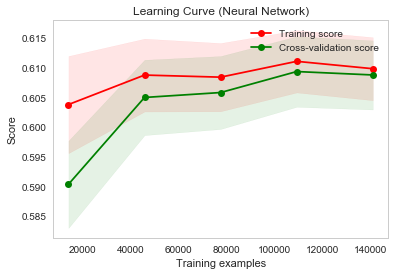

In [52]:
sns.set(style="whitegrid")

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt


X, y = scaled_X_res, y_res


title = "Learning Curve (Neural Network)"
# Cross validation with 100 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=23432)

estimator = MLPClassifier(hidden_layer_sizes=(10,5,5), activation = 'relu', tol=1e-4, random_state=23832)
plot_learning_curve(estimator, title, X, y, cv=cv, n_jobs=4)

plt.show()

From the above chart, we can conclude the absence of high variance as score doesn't really improve much as we increase the training set.  

_____________________________________________________________
Accuracy score on train data: 0.609749
Accuracy score on test data: 0.613748
Classification Report:
             precision    recall  f1-score   support

          0       0.60      0.72      0.65     22110
          1       0.64      0.51      0.57     21983

avg / total       0.62      0.61      0.61     44093

_____________________________________________________________
Confusion matrix, without normalization
[[15863  6247]
 [10784 11199]]
Normalized confusion matrix
[[0.72 0.28]
 [0.49 0.51]]


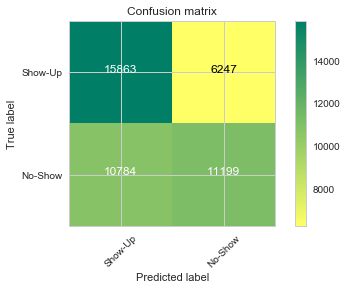

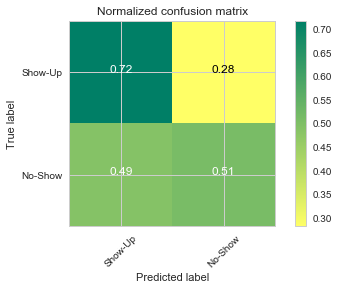

In [54]:
estimator.fit(X_train, y_train)
y_pred_ann_train = estimator.predict(X_train)
y_pred_ann_test = estimator.predict(X_test)

ann_acc_train = metrics.accuracy_score(y_train, y_pred_ann_train)
ann_acc_test = metrics.accuracy_score(y_test, y_pred_ann_test)
ann_rp = metrics.classification_report(y_test, y_pred_ann_test)
print("_____________________________________________________________")
print("Accuracy score on train data: {:5f}".format(ann_acc_train))
print("Accuracy score on test data: {:5f}".format(ann_acc_test))
print("Classification Report:")
print(ann_rp)
print("_____________________________________________________________")

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_ann_test)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cm, classes=class_names,
                      title='Confusion matrix')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()

### Closing Remarks

This data set was chosen to easily perform Data Wrangling, EDA, and Model designs.
Out of the above models, Random forest resulted in the highest accuracy but by properly tuning the Artificial Neural Network, we can still get better results.